# ClimateWins 2.4: Machine Learning, Optimizing Hyperparameters

  
ClimateWins has been contacted by an Air Ambulance company that’s noticed its work on weather prediction. It’s interested in predicting days with high precision that are safe to fly its helicopters. ClimateWins has asked you to start the process by finding optimized hyperparameters in your deep learning and random forest models. Having a highly optimized model will lead to better predictions based on past data and, thus, the ability to predict future data in many different applications. Do a hyperparameter search on your models, iterating to define small sections if needed.

### Table of Contents
#### Part I
[1. Import libraries and dataset](#1.-Import-libraries-and-dataset)  
[2. Split the data](#2.-Split-the-data)  
[3. Searching Optimal Hyperparameters: Grid & Random Search](#3.-Searching-Optimal-Hyperparameters:-Grid-&-Random-Search)  
[4. Applying Best model](#4.-Applying-Best-Model)  


### 1. Import libraries and dataset

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import os
import operator
import time
import matplotlib.pyplot as plt
import tensorflow as tf
from sklearn import datasets  
from sklearn.ensemble import RandomForestClassifier
from numpy import argmax
from sklearn import metrics  
from sklearn.tree import plot_tree
from sklearn import tree
from sklearn.model_selection import GridSearchCV
from scipy.stats import randint
from sklearn.model_selection import RandomizedSearchCV

In [11]:
path = r'C:\Users\jinu5\Desktop\careerfoundry\ML\DataSet\original data'
df = pd.read_csv(os.path.join(path, 'df_cleaned.csv'), index_col=False)
df_y = pd.read_csv(os.path.join(path, 'Dataset-Answers-Weather_Prediction_Pleasant_Weather.csv'), index_col=False)

In [3]:
city_dict = {
 0: 'BASEL',
 1: 'BELGRADE',
 2: 'BUDAPEST',
 3: 'DEBILT',
 4: 'DUSSELDORF',
 5: 'HEATHROW',
 6: 'KASSEL',
 7: 'LJUBLJANA',
 8: 'MAASTRICHT',
 9: 'MADRID',
 10: 'MUNCHENB',
 11: 'OSLO',
 12: 'SONNBLICK',
 13: 'STOCKHOLM',
 14: 'VALENTIA'
}

In [4]:
obtype = [
    'cloud_cover',
 'humidity',
 'pressure',
 'global_radiation',
 'precipitation',
 'sunshine',
 'temp_mean',
 'temp_min',
 'temp_max'
]

In [5]:
tf.random.set_seed(23)

### ------

### 2. Split the data
all stations in 10 years / KASSEL in all years 

In [106]:
dfy = df_y.drop(['DATE'], axis=1)

In [7]:
# creating X,y dataframe with Numpy type
X=df.to_numpy()
y=dfy.to_numpy()

#### creating sub-dataset with 10 years data

In [17]:
X_10year=X[10000:10000+3653]
y_10yaer=y[10000:10000+3653]

In [18]:
X_10year.shape

(3653, 135)

In [19]:
from sklearn.model_selection import train_test_split
X_train_10,X_test_10, y_train_10, y_test_10 = train_test_split(X_10year, y_10yaer, random_state=23)

In [20]:
print(X_train_10.shape, X_test_10.shape)
print(y_train_10.shape, y_test_10.shape)

(2739, 135) (914, 135)
(2739, 15) (914, 15)


#### KASSEL in all years

In [21]:
df_KASSEL = pd.DataFrame() 
for column in df.columns:  
    if 'KASSEL' in column:  
        df_KASSEL[column] = df[column]  

print(df_KASSEL)

       KASSEL_cloud_cover  KASSEL_humidity  KASSEL_pressure  \
0                       8             0.82           1.0094   
1                       6             0.86           1.0086   
2                       8             0.91           1.0129   
3                       6             0.87           1.0290   
4                       7             0.86           1.0262   
...                   ...              ...              ...   
22945                   4             0.82           1.0291   
22946                   3             0.81           1.0270   
22947                   3             0.77           1.0238   
22948                   3             0.77           1.0114   
22949                   3             0.77           1.0161   

       KASSEL_global_radiation  KASSEL_precipitation  KASSEL_sunshine  \
0                         0.28                  0.48              1.6   
1                         0.12                  0.27              0.0   
2                       

In [22]:
y_KASSEL = pd.DataFrame() 

for column in dfy.columns:  
    if 'KASSEL' in column:  
        y_KASSEL[column] = dfy[column]  

print(y_KASSEL)

       KASSEL_pleasant_weather
0                            0
1                            0
2                            0
3                            0
4                            0
...                        ...
22945                        0
22946                        0
22947                        0
22948                        0
22949                        0

[22950 rows x 1 columns]


In [23]:
X_KASSEL=df_KASSEL.to_numpy()
y_KASSEL=y_KASSEL.to_numpy()

In [24]:
X_train_KASSEL,X_test_KASSEL, y_train_KASSEL, y_test_KASSEL = train_test_split(X_KASSEL, y_KASSEL, random_state=23)

In [25]:
print(X_train_KASSEL.shape, X_test_KASSEL.shape)
print(y_train_KASSEL.shape, y_test_KASSEL.shape)

(17212, 9) (5738, 9)
(17212, 1) (5738, 1)


### -------

### 3. Searching Optimal Hyperparameters: Grid & Random Search
[Go back to the Talbe of Contents](#Table-of-Contents)

#### 3.1. 10 years dataset

#### Grid Search

In [26]:
# creating a RF classifier
clf = RandomForestClassifier(n_estimators = 100, max_depth=5)  

In [41]:
# Grid search cv
grid_space={'max_depth':[3,5,10,None],
              'n_estimators':[10,100, 200],
              'max_features':[1,3,5,7],
              'min_samples_leaf':[1,2,3],
              'min_samples_split':[2,3]
           }

In [42]:
start = time.time()
grid_10 = GridSearchCV(clf,param_grid=grid_space,cv=3,scoring='accuracy', verbose=3, n_jobs=-1)
model_grid_10 = grid_10.fit(X_train_10, y_train_10)
print('Search took %s minutes' % ((time.time() - start)/60))

Fitting 3 folds for each of 288 candidates, totalling 864 fits
Search took 10.24837875366211 minutes


In [43]:
# grid search results
print('Best GRID search hyperparameters are: '+str(model_grid_10.best_params_))
print('Best GRID search score is: '+str(model_grid_10.best_score_))

Best GRID search hyperparameters are: {'max_depth': None, 'max_features': 7, 'min_samples_leaf': 1, 'min_samples_split': 3, 'n_estimators': 200}
Best GRID search score is: 0.5334063526834611


#### Random Search

In [36]:
# creating a RF classifier
clf2= RandomForestClassifier()

In [52]:
# Random search cv
rs_space={'max_depth':list(np.arange(10, 100, step=10)) + [None],
              'n_estimators':np.arange(10, 500, step=50),
              'max_features':randint(1,7),
              'criterion':['gini','entropy'],
              'min_samples_leaf':randint(1,4),
              'min_samples_split':np.arange(2, 10, step=2)
         }

In [53]:
start = time.time()
rf_random1 = RandomizedSearchCV(clf2, rs_space, n_iter=200, scoring='accuracy', verbose=3, n_jobs=-1, cv=3) #500
model_random1_10 = rf_random1.fit(X_train_10, y_train_10)
print('Search took %s minutes' % ((time.time() - start)/60))`

Fitting 3 folds for each of 200 candidates, totalling 600 fits
Search took 28.486479008197783 minutes


In [54]:
# grid search results
print('Best GRID search hyperparameters are: '+str(model_grid_10.best_params_))
print('Best GRID search score is: '+str(model_grid_10.best_score_))
# random random search results
print('Best RANDOM search hyperparameters are: '+str(model_random_10.best_params_))
print('Best RANDOM search score is: '+str(model_random_10.best_score_))

Best GRID search hyperparameters are: {'max_depth': None, 'max_features': 7, 'min_samples_leaf': 1, 'min_samples_split': 3, 'n_estimators': 200}
Best GRID search score is: 0.5334063526834611
Best RANDOM search hyperparameters are: {'criterion': 'gini', 'max_depth': 50, 'max_features': 6, 'min_samples_leaf': 1, 'min_samples_split': 4, 'n_estimators': 250}
Best RANDOM search score is: 0.5293902884264331


In [46]:
# Random search cv 2nd
rs_space2={'max_depth':list(np.arange(50, 200, step=20)) + [None],
              'n_estimators':np.arange(100, 300, step=25),
              'max_features':randint(1,7),
              'criterion':['gini','entropy'],
              'min_samples_leaf':randint(1,4),
              'min_samples_split':np.arange(2, 10, step=2)
         }

In [47]:
start = time.time()
rf_random2 = RandomizedSearchCV(clf2, rs_space2, n_iter=200, scoring='accuracy', verbose=3, n_jobs=-1, cv=3) #500
model_random_10 = rf_random2.fit(X_train_10, y_train_10)
print('Search took %s minutes' % ((time.time() - start)/60))

Fitting 3 folds for each of 200 candidates, totalling 600 fits
Search took 59.744504070281984 minutes


In [49]:
# grid search results
print('Best GRID search hyperparameters are: '+str(model_grid_10.best_params_))
print('Best GRID search score is: '+str(model_grid_10.best_score_))
# random random search results
print('Best RANDOM search hyperparameters are: '+str(model_random_10.best_params_))
print('Best RANDOM search score is: '+str(model_random_10.best_score_))

Best GRID search hyperparameters are: {'max_depth': None, 'max_features': 7, 'min_samples_leaf': 1, 'min_samples_split': 3, 'n_estimators': 200}
Best GRID search score is: 0.5334063526834611
Best RANDOM search hyperparameters are: {'criterion': 'gini', 'max_depth': 50, 'max_features': 6, 'min_samples_leaf': 1, 'min_samples_split': 4, 'n_estimators': 250}
Best RANDOM search score is: 0.5293902884264331


#### I tested 2 diffrent random search, but results are same.

#### 3.2. KASSEL dataset

#### Grid Search

In [55]:
# creating a RF classifier
clf_k = RandomForestClassifier(n_estimators = 100, max_depth=5)  

In [60]:
# Grid search cv
grid_space_K={'max_depth':[3,5,10,None],
              'n_estimators':[10,100, 200],
              'max_features':[1,3,5,7],
              'min_samples_leaf':[1,2,3],
              'min_samples_split':[2,3]
           }

In [62]:
start = time.time()
grid_K = GridSearchCV(clf_k,param_grid=grid_space_K,cv=3,scoring='accuracy', verbose=3, n_jobs=-1)
model_grid_K= grid_K.fit(X_train_KASSEL, y_train_KASSEL)
print('Search took %s minutes' % ((time.time() - start)/60))

Fitting 3 folds for each of 288 candidates, totalling 864 fits


C:\Users\jinu5\anaconda3\Lib\site-packages\sklearn\base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


Search took 11.221456074714661 minutes


#### Random Search

In [63]:
# creating a RF classifier
clf_KR= RandomForestClassifier()

In [64]:
# Random search cv
rs_space_K={'max_depth':list(np.arange(10, 100, step=10)) + [None],
              'n_estimators':np.arange(10, 500, step=50),
              'max_features':randint(1,7),
              'criterion':['gini','entropy'],
              'min_samples_leaf':randint(1,4),
              'min_samples_split':np.arange(2, 10, step=2)
         }

In [66]:
start = time.time()
rf_random_K = RandomizedSearchCV(clf_KR, rs_space_K, n_iter=200, scoring='accuracy', verbose=3, n_jobs=-1, cv=3) #500
model_random_K = rf_random_K.fit(X_train_KASSEL, y_train_KASSEL)
print('Search took %s minutes' % ((time.time() - start)/60))

Fitting 3 folds for each of 200 candidates, totalling 600 fits


C:\Users\jinu5\anaconda3\Lib\site-packages\sklearn\base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


Search took 29.067838899294536 minutes


In [67]:
# grid search results
print('Best GRID search hyperparameters are: '+str(model_grid_K.best_params_))
print('Best GRID search score is: '+str(model_grid_10.best_score_))
# random random search results
print('Best RANDOM search hyperparameters are: '+str(model_random_K.best_params_))
print('Best RANDOM search score is: '+str(model_random_10.best_score_))

Best GRID search hyperparameters are: {'max_depth': None, 'max_features': 7, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}
Best GRID search score is: 0.5334063526834611
Best RANDOM search hyperparameters are: {'criterion': 'gini', 'max_depth': 70, 'max_features': 4, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 460}
Best RANDOM search score is: 0.5293902884264331


In [69]:
y_train_KASSEL.shape

(17212, 1)

In [70]:
y_train_10.shape

(2739, 15)

## Q) 
I ran a Grid Search and a Random Search on 10 years of data from all stations and all years of data from Kassel. 
The best parameters found by Grid Search and Random Search were different for the two datasets, but the best scores were identical to within a few decimal points. It seems very weird to me. 

- All stations results  
Best GRID search hyperparameters are: {'max_depth': None, 'max_features': 7, 'min_samples_leaf': 1, 'min_samples_split': 3, 'n_estimators': 200}  
Best GRID search score is: 0.533406352683461

Best RANDOM search hyperparameters are: {'criterion': 'gini', 'max_depth': 50, 'max_features': 6, 'min_samples_leaf': 1, 'min_samples_split': 4, 'n_estimators': 25  0}
Best RANDOM search score is: 0.5293902884264  


.
     
- KASSEL results  
Best GRID search hyperparameters are: {'max_depth': None, 'max_features': 7, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}  
Best GRID search score is: 0.533406352683461  1

Best RANDOM search hyperparameters are: {'criterion': 'gini', 'max_depth': 70, 'max_features': 4, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 46  0}
Best RANDOM search score is: 0.5293902884264331331

### 4. Applying Best Model
[Go back to Table of Contents](#Part-I)

#### 4.1. 10 Years Dataset

In [77]:
# creating a RF classifier with the best results from above
# Best GRID search hyperparameters are: {'max_depth': None, 'max_features': 7, 'min_samples_leaf': 1, 'min_samples_split': 3, 'n_estimators': 200}  
# Best GRID search score is: 0.5334063526834611
# Best RANDOM search hyperparameters are: {'criterion': 'gini', 'max_depth': 50, 'max_features': 6, 'min_samples_leaf': 1, 'min_samples_split': 4, 'n_estimators': 250}  
# Best RANDOM search score is: 0.5293902884264331  

# applying Best GRID search hyperparameters
clf_10_best = RandomForestClassifier(max_depth =None, max_features= 7, min_samples_leaf= 1, min_samples_split= 3, n_estimators= 200)  
  
# Training the model on the training dataset
# fit function is used to train the model using the training sets as parameters

clf_10_best.fit(X_train_10, y_train_10)

RandomForestClassifier(max_features=7, min_samples_split=3, n_estimators=200)

#### Grid search Accuracy 

In [83]:
# performing predictions on the test dataset
y_pred_10 = clf_10_best.predict(X_test_10)
  
# using metrics module for accuracy calculation
print("Model Accuracy: ", metrics.accuracy_score(y_test_10, y_pred_10))

Model Accuracy:  0.5678336980306345


In [98]:
# creating a RF classifier with the best results from above
# Best RANDOM search hyperparameters are: {'criterion': 'gini', 'max_depth': 50, 'max_features': 6, 'min_samples_leaf': 1, 'min_samples_split': 4, 'n_estimators': 250}  
# Best RANDOM search score is: 0.5293902884264331  

# applying Best Random search hyperparameters
clf_10_best_r = RandomForestClassifier(criterion= 'gini', max_depth= 50, max_features= 6, min_samples_leaf= 1, min_samples_split= 4, n_estimators= 250)  
  
# Training the model on the training dataset
# fit function is used to train the model using the training sets as parameters

clf_10_best_r.fit(X_train_10, y_train_10)

RandomForestClassifier(max_depth=50, max_features=6, min_samples_split=4,
                       n_estimators=250)

#### Random search Accuracy

In [99]:
# performing predictions on the test dataset
y_pred_10_r = clf_10_best_r.predict(X_test_10)
  
# using metrics module for accuracy calculation
print("Model Accuracy: ", metrics.accuracy_score(y_test_10, y_pred_10_r))

Model Accuracy:  0.5612691466083151


In [78]:
pleasant = ['unpleasant',
       'pleasant'
      ]

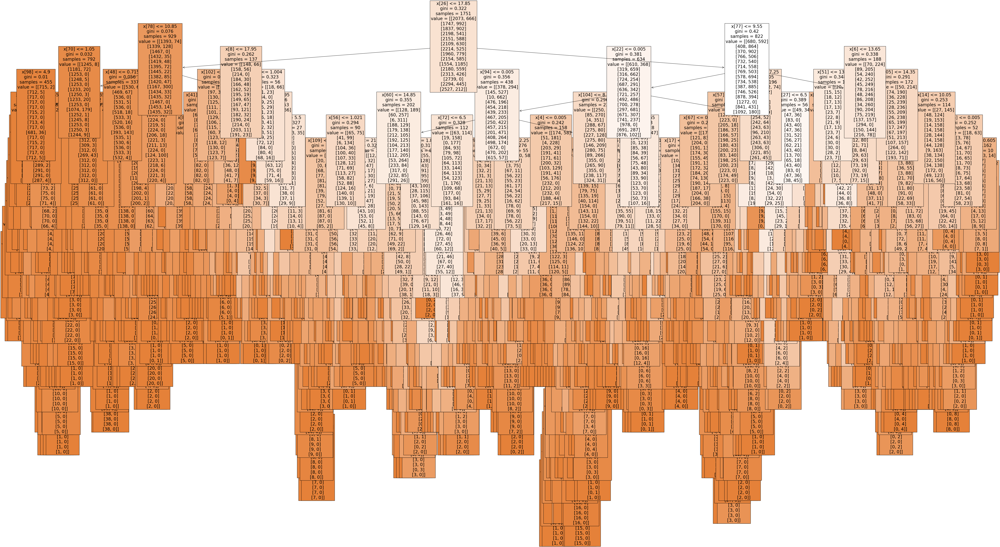

In [79]:
fig = plt.figure(figsize=(80, 40))
plot_tree(clf_10_best.estimators_[15], fontsize=20, class_names=pleasant, filled=True)

plt.savefig('decision_tree_plot_10_best_e15.png')

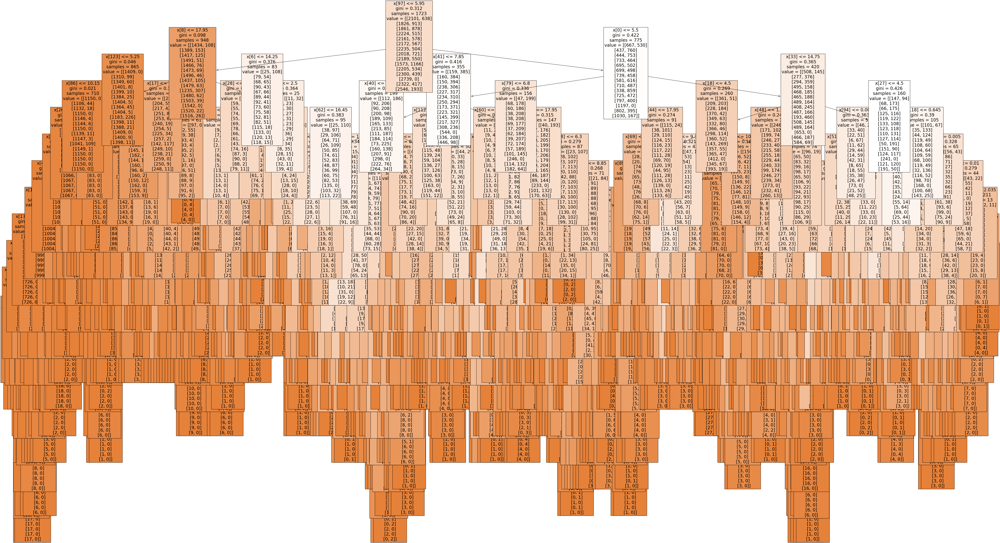

In [80]:
fig = plt.figure(figsize=(80, 40))
plot_tree(clf_10_best.estimators_[100], fontsize=20, class_names=pleasant, filled=True)

plt.savefig('decision_tree_plot_10_best_e100.png')

#### Accuracy 

#### Check the Importance by city and by observation type

#### by City

In [87]:
np.set_printoptions(threshold=np.inf)
newarray_10_best = clf_10_best.feature_importances_
newarray_10_best

array([0.00270375, 0.00321091, 0.00313748, 0.00466533, 0.01114214,
       0.00473447, 0.00800711, 0.0058325 , 0.0338353 , 0.00334634,
       0.00359722, 0.00308175, 0.00358551, 0.01136878, 0.00396617,
       0.01072779, 0.00414261, 0.01080281, 0.0028033 , 0.00300853,
       0.00321819, 0.0062776 , 0.00951282, 0.00511081, 0.01085702,
       0.00617704, 0.01135181, 0.00383182, 0.00320644, 0.00424379,
       0.00880226, 0.00884561, 0.00409511, 0.02364852, 0.0039533 ,
       0.01801738, 0.00581715, 0.00372128, 0.00412171, 0.0065142 ,
       0.01209684, 0.00858172, 0.01860481, 0.00409017, 0.02605949,
       0.00218303, 0.00360239, 0.00434774, 0.00437982, 0.0071063 ,
       0.00391552, 0.01531506, 0.00556566, 0.01741723, 0.00276271,
       0.00357274, 0.00463237, 0.00613739, 0.00988618, 0.00664575,
       0.02737764, 0.00625816, 0.02888257, 0.00300476, 0.00343449,
       0.00342623, 0.00437233, 0.01250418, 0.00454342, 0.02043189,
       0.00404555, 0.01675194, 0.00516462, 0.00419158, 0.00386

In [88]:
newarray_10_best = newarray_10_best.reshape(-1,9,15)

In [89]:
sumarray_10_best = np.sum(newarray_10_best[0], axis=0)
sumarray_10_best

array([0.08203565, 0.05834628, 0.08519324, 0.08162536, 0.05644141,
       0.08243996, 0.06083301, 0.05352522, 0.08697795, 0.05682386,
       0.04541507, 0.05848781, 0.06591831, 0.05085751, 0.07507938])

In [90]:
city = [
 'BASEL',
 'BELGRADE',
 'BUDAPEST',
 'DEBILT',
 'DUSSELDORF',
 'HEATHROW',
 'KASSEL',
 'LJUBLJANA',
 'MAASTRICHT',
 'MADRID',
 'MUNCHENB',
 'OSLO',
 'SONNBLICK',
 'STOCKHOLM',
 'VALENTIA'
]

In [91]:
important_10_best = pd.Series(sumarray_10_best, index = city) #.sort_values(ascending = False)
important_10_best

BASEL         0.082036
BELGRADE      0.058346
BUDAPEST      0.085193
DEBILT        0.081625
DUSSELDORF    0.056441
HEATHROW      0.082440
KASSEL        0.060833
LJUBLJANA     0.053525
MAASTRICHT    0.086978
MADRID        0.056824
MUNCHENB      0.045415
OSLO          0.058488
SONNBLICK     0.065918
STOCKHOLM     0.050858
VALENTIA      0.075079
dtype: float64

['BASEL', 'BELGRADE', 'BUDAPEST', 'DEBILT', 'DUSSELDORF', 'HEATHROW', 'KASSEL', 'LJUBLJANA', 'MAASTRICHT', 'MADRID', 'MUNCHENB', 'OSLO', 'SONNBLICK', 'STOCKHOLM', 'VALENTIA']


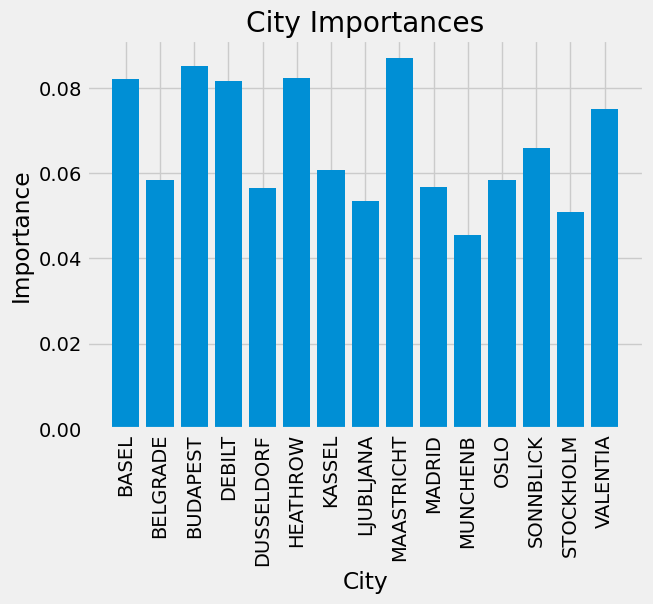

In [92]:
%matplotlib inline

plt.style.use('fivethirtyeight')
# list of x locations for plotting
x_values_10_best = list(range(len(important_10_best)))
print(city)

plt.bar(x_values_10_best, important_10_best, orientation = 'vertical')
plt.xticks(x_values_10_best, city, rotation='vertical')
plt.ylabel('Importance'); plt.xlabel('City'); plt.title('City Importances');
plt.savefig('City Importances_10_best.png', bbox_inches='tight')

#### by observation type

In [93]:
newarray_10_best_ob = newarray_10_best.reshape(-1,15,9)

In [94]:
sumarray_10_best_ob = np.sum(newarray_10_best_ob[0], axis=0)
sumarray_10_best_ob

array([0.04650216, 0.04966916, 0.05454694, 0.08246656, 0.13148799,
       0.07337295, 0.21826746, 0.08342833, 0.26025845])

In [95]:
important_10_best_ob = pd.Series(sumarray_10_best_ob, index = obtype) #.sort_values(ascending = False)
important_10_best_ob

cloud_cover         0.046502
humidity            0.049669
pressure            0.054547
global_radiation    0.082467
precipitation       0.131488
sunshine            0.073373
temp_mean           0.218267
temp_min            0.083428
temp_max            0.260258
dtype: float64

['cloud_cover', 'humidity', 'pressure', 'global_radiation', 'precipitation', 'sunshine', 'temp_mean', 'temp_min', 'temp_max']


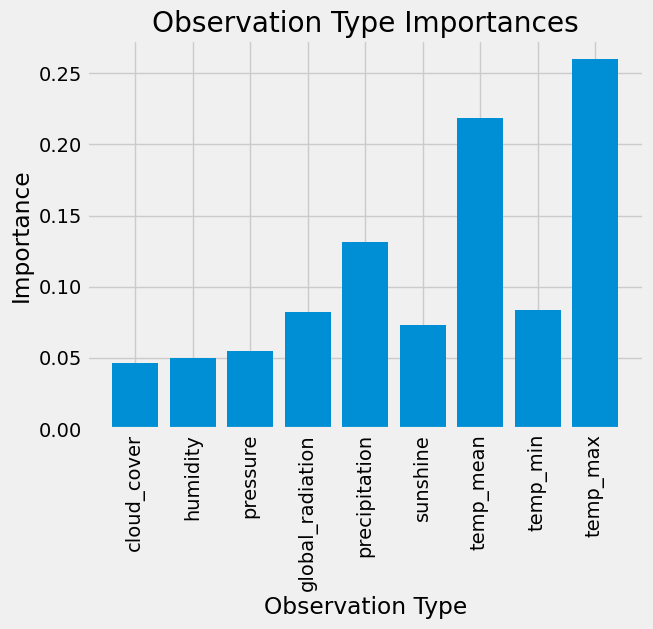

In [96]:
%matplotlib inline

plt.style.use('fivethirtyeight')
# list of x locations for plotting
x_values_10_best_ob = list(range(len(important_10_best_ob)))
print(obtype)

plt.bar(x_values_10_best_ob, important_10_best_ob, orientation = 'vertical')
plt.xticks(x_values_10_best_ob, obtype, rotation='vertical')
plt.ylabel('Importance'); plt.xlabel('Observation Type'); plt.title('Observation Type Importances')
plt.savefig('10_best_Observation Type Importances_1.png', bbox_inches='tight')

#### 4.2. KASSEL Dataset

In [82]:
# creating a RF classifier with the best results from above
# Best GRID search hyperparameters are: {'max_depth': None, 'max_features': 7, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}  
# Best GRID search score is: 0.5334063526834611  
# Best RANDOM search hyperparameters are: {'criterion': 'gini', 'max_depth': 70, 'max_features': 4, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 460}  
# Best RANDOM search score is: 0.5293902884264331

# In the Kassel case, I applied RANDOM search hyperparameters. 
clf_KASSEL_best = RandomForestClassifier(criterion= 'gini', max_depth= 70, max_features= 4, min_samples_leaf= 1, min_samples_split= 2, n_estimators= 460)  
  
# Training the model on the training dataset
# fit function is used to train the model using the training sets as parameters

clf_KASSEL_best.fit(X_train_KASSEL, y_train_KASSEL)

C:\Users\jinu5\anaconda3\Lib\site-packages\sklearn\base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


RandomForestClassifier(max_depth=70, max_features=4, n_estimators=460)

#### Accuracy

In [97]:
# performing predictions on the test dataset
y_pred_KA= clf_KASSEL_best.predict(X_test_KASSEL)
  
# using metrics module for accuracy calculation
print("Model Accuracy: ", metrics.accuracy_score(y_test_KASSEL, y_pred_KA))

Model Accuracy:  0.9675845242244685


# Q)
Why is there such a large difference between the accuracy shown in the Random Search results and the accuracy after training the model?
  
Best RANDOM search score is: 0.5293902884264331  
Model Accuracy:  0.9675845242244685
  
I was so surprised by this result that I also tested both the Grid and Random models on the All stations dataset, in which case there was no significant difference in search score and model accuracy in either case. 

In [84]:
pleasant = ['unpleasant',
       'pleasant'
      ]

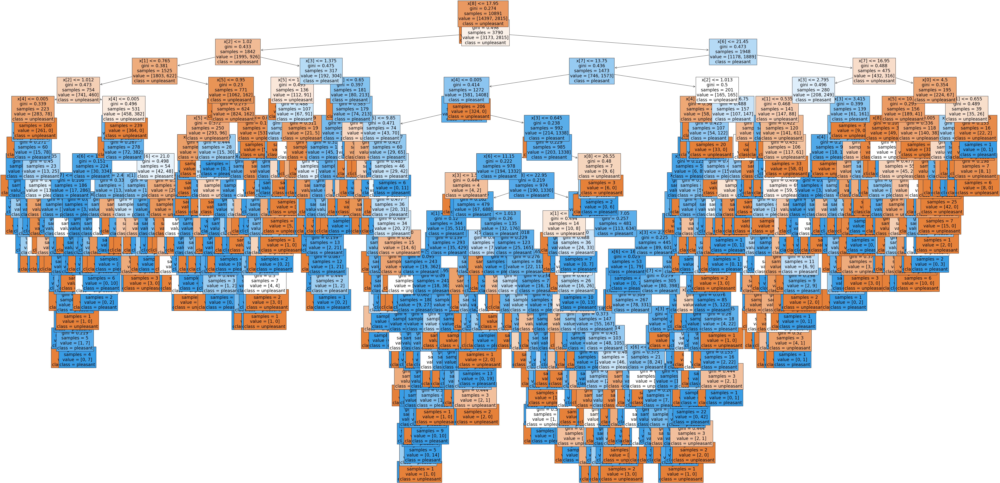

In [85]:
fig = plt.figure(figsize=(80, 40))
plot_tree(clf_KASSEL_best.estimators_[15], fontsize=20, class_names=pleasant, filled=True)

plt.savefig('decision_tree_plot_KASSEL_best_e15.png')

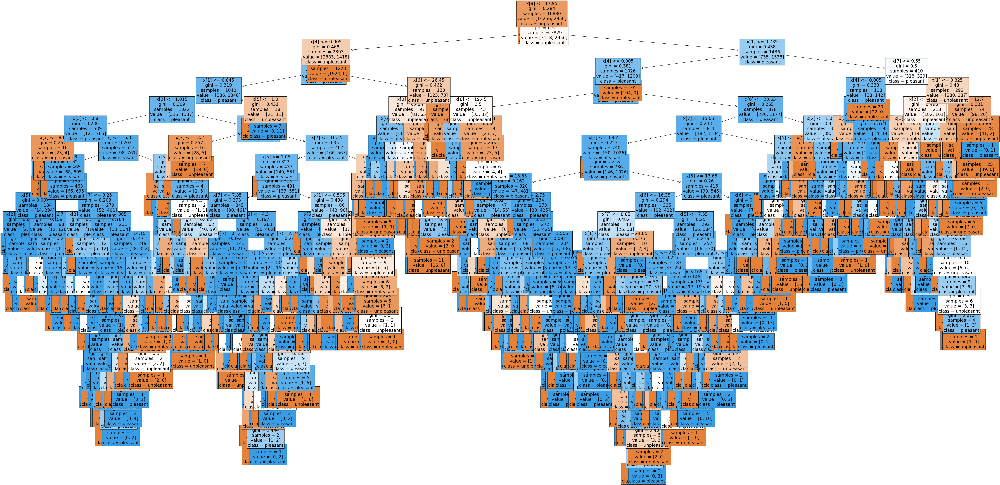

In [86]:
fig = plt.figure(figsize=(80, 40))
plot_tree(clf_KASSEL_best.estimators_[100], fontsize=20, class_names=pleasant, filled=True)

plt.savefig('decision_tree_plot_KASSEL_best_e100.png')

#### Check the Importance by city and by observation type

#### by observation type

In [102]:
newarray_KASSEL_best_ob = newarray_KASSEL_best.reshape(-1,1,9)

In [103]:
sumarray_KASSEL_best_ob = np.sum(newarray_KASSEL_best_ob[0], axis=0)
sumarray_KASSEL_best_ob

array([0.01525178, 0.04080258, 0.03948695, 0.08873948, 0.29289701,
       0.07580705, 0.13042756, 0.04390716, 0.27268041])

In [104]:
important_KASSEL_best_ob = pd.Series(sumarray_KASSEL_best_ob, index = obtype) #.sort_values(ascending = False)
important_KASSEL_best_ob

cloud_cover         0.015252
humidity            0.040803
pressure            0.039487
global_radiation    0.088739
precipitation       0.292897
sunshine            0.075807
temp_mean           0.130428
temp_min            0.043907
temp_max            0.272680
dtype: float64

['cloud_cover', 'humidity', 'pressure', 'global_radiation', 'precipitation', 'sunshine', 'temp_mean', 'temp_min', 'temp_max']


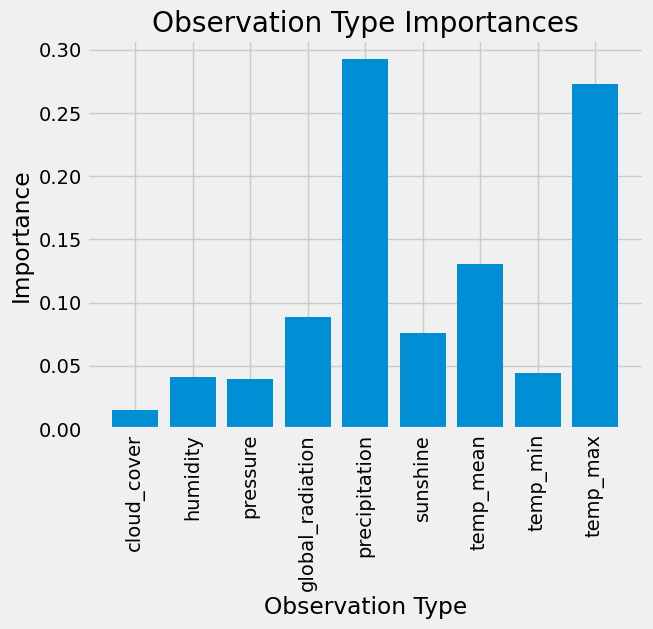

In [105]:
%matplotlib inline

plt.style.use('fivethirtyeight')
# list of x locations for plotting
x_values_KASSEL_best_ob = list(range(len(important_KASSEL_best_ob)))
print(obtype)

plt.bar(x_values_KASSEL_best_ob, important_KASSEL_best_ob, orientation = 'vertical')
plt.xticks(x_values_KASSEL_best_ob, obtype, rotation='vertical')
plt.ylabel('Importance'); plt.xlabel('Observation Type'); plt.title('Observation Type Importances')
plt.savefig('KASSEL_Observation Type Importances_1.png', bbox_inches='tight')

### 4.3. Compare the results you get with your optimized data with the results you had in Exercise 2.3. Do they show a significant change in the importance of your variables? What are the most important variables to the analysis? Write out your observations in a new document.

The most important variables didn't change in the optimized model, although the importance of the variables shifted slightly. 
For all stations, maximum temperature, average temperature, and precipitation are the three most important factors.   
When we restricted our observations to one city, Kassel saw a tremendous increase in accuracy, to 96.7% in the best model.   
This is likely due to the fact that by narrowing the observation area and increasing the observation period, the deviations or errors in the data are reduced, and the accuracy of the forecast increases. 

[Go Back to the Table of Contents](#Table-of-Contents)